# IBM_Applied-Data-Science-Capstone_Week5
- Final Assignment:
- Author: Juan Carlos Villegas

## Introduction: Business Problem 
 - Wolt Delivery App: Wolt is a Helsinki-based technology company known for our food delivery platform. Wolt makes it easy for hungry people to find great food from our restaurant partners to either pick it up themself, or have it delivered by one of our delivery partners. Today, Wolt is also increasingly known for enabling people to get the same Wolt delivery experience from virtually any type of grocery store, retail shop or boutique within the city. Wolt launched in the summer of 2015 in Helsinki, Finland together with ten restaurants. In the five short years since, we’ve expanded to 23 countries and more than 129 cities, serving over 10 million customers together with 60 000 courier partners as well as 30 000 restaurant and retail partners. 

## Objective:
- Identify opportunities for efficiency. 
- Produce interesting statistics and graphs about the dataset. Show the most important features and explain their impact.

- Explore geo location cluster behavior. 

## Data:
The Wolt dataset containts a subset of orders that occured in Aug and Sep 2020.   
['TIMESTAMP', 'ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES', 'ITEM_COUNT', 'USER_LAT', 'USER_LONG', 'VENUE_LAT', 'VENUE_LONG', 'ESTIMATED_DELIVERY_MINUTES', 'ACTUAL_DELIVERY_MINUTES', 'CLOUD_COVERAGE', 'TEMPERATURE', 'WIND_SPEED', 'PRECIPITATION']

## Methodology:
- Through the report we will develop metrics to benchmark overall delivery speed and delivery delay. 
- Leveraging boxplots, heatmaps, clustering. 

### Import Libraries:

In [1]:
#Basic
import pandas as pd
import numpy as np
#APIs and Web Scraping
import requests
from bs4 import BeautifulSoup 
from pandas.io.json import json_normalize
#Maps
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import folium # map rendering library
#Data Visualization
import matplotlib.pyplot as plt 
import plotly.express as px
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as colors
#Formatting
import datetime
from datetime import timedelta
pd.options.display.float_format = "{:,.3f}".format
#Other
from haversine import haversine, Unit
#ML libs 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import KMeans
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

### Read File:

File was sourced from raw.githubusercontent.com/woltapp/data-science-summer-intern-2021/main/orders_autumn_2020.csv

In [2]:
orders = pd.read_csv("https://raw.githubusercontent.com/woltapp/data-science-summer-intern-2021/main/orders_autumn_2020.csv", parse_dates= ['TIMESTAMP']) 

In [3]:
orders.columns

Index(['TIMESTAMP', 'ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES',
       'ITEM_COUNT', 'USER_LAT', 'USER_LONG', 'VENUE_LAT', 'VENUE_LONG',
       'ESTIMATED_DELIVERY_MINUTES', 'ACTUAL_DELIVERY_MINUTES',
       'CLOUD_COVERAGE', 'TEMPERATURE', 'WIND_SPEED', 'PRECIPITATION'],
      dtype='object')

### Formatting and Basic Variable Development:

Creating a Delay Variables:

In [4]:
orders = orders.rename(columns={"ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES": "Delay"})
orders ["Delay"] = orders ["Delay"] * -1 
# Segment Delay 
conditions = [(orders['Delay'] <= 0),
              (orders['Delay'] > 0 ) & (orders['Delay'] <=5),   
              (orders['Delay'] > 5 ) & (orders['Delay'] <=10),
              (orders['Delay'] > 10 ) & (orders['Delay'] <=15),
              (orders['Delay'] > 15)  
            ]
# create a list of the values we want to assign for each condition
values = ['NoDelay','5 min Delay', '5-10 min Delay',"10-15 min Delay", "+15 min Delay"]
# create a new column and use np.select to assign values to it using our lists as arguments
orders['DelayType'] = np.select(conditions, values)

Formatting Dates:

In [5]:
orders ['Hr'] =  orders.TIMESTAMP.dt.hour 
orders ['Day'] =  orders.TIMESTAMP.dt.day 
orders ['Month'] =  orders.TIMESTAMP.dt.month 
orders ['DayMonth'] =  orders ['Day'].astype(str) + "-" + orders ['Month'].astype(str)

#Chaing Day of week to string like Mon, Tue, etc.
orders ['DayofWeek'] =  orders.TIMESTAMP.dt.dayofweek    #Monday = 0 thtough Sunday = 6 
conditions = [
    (orders['DayofWeek'] == 0) , (orders['DayofWeek'] == 1) , (orders['DayofWeek'] == 2) ,
    (orders['DayofWeek'] == 3),(orders['DayofWeek'] == 4),(orders['DayofWeek'] == 5),
    (orders['DayofWeek'] == 6)    
            ]
values = ['Mon','Tue', 'Wed', 'Thur','Fri','Sat','Sun']
orders['DayofWeek_Name'] = np.select(conditions, values)

#Setting Week_Part between weekends and weekdays
conditions = [
    (orders['DayofWeek'] == 0) | (orders['DayofWeek'] == 1) | (orders['DayofWeek'] == 2) | (orders['DayofWeek'] == 3) | (orders['DayofWeek'] == 4),
    (orders['DayofWeek'] == 5) | (orders['DayofWeek'] == 6)    
            ]
values = ['WeekDay','Weekend']
orders['Week_Part'] = np.select(conditions, values)

# Segment time of day
conditions = [(orders['Hr'] >= 0 ) & (orders['Hr'] <=7),   
              (orders['Hr'] > 7) & (orders['Hr'] <=10),
              (orders['Hr'] > 10) & (orders['Hr'] <= 12),
              (orders['Hr'] > 12) & (orders['Hr'] <= 17),
              (orders['Hr'] > 17)
            ]
values = ['MorningLow','MorningRush', 'MidDay','AfternoonRush',"EveningLow"]
orders['TimeOfDay'] = np.select(conditions, values)

Creating Distance Related Metrics:

In [6]:
# Round GPS coordinates: In practice we should not change GPS, but is seems that through privacy decimals points have been removed from df 
orders = orders.round(3) 

#Distance Calculations
distances_ls = []
for index, row in orders.iterrows():
    distances = haversine([orders ['USER_LAT'][index], orders ['USER_LONG'][index]], [orders ['VENUE_LAT'][index], orders ['VENUE_LONG'][index]], unit='km')
    distances_ls.append(distances)
orders ['Distances'] = distances_ls

# Segmenting Distances
conditions = [
    (orders['Distances'] >=0) & (orders['Distances']<=0.5),
    (orders['Distances'] >0.5) & (orders['Distances']<=1),
    (orders['Distances'] > 1) & (orders['Distances'] <= 1.5),
    (orders['Distances'] > 1.5) & (orders['Distances'] <= 2),
    (orders['Distances'] > 2)    
            ]
values = ['0-0.5 km','0.5-1 km', '1-1.5 km', '1.5-2 Km', '2+ km']
orders['TripDistanceType'] = np.select(conditions, values)

Creating Speed Variable:

In [7]:
orders ['Pace'] = orders ['Distances']/orders ['ACTUAL_DELIVERY_MINUTES']*60   #km/hr
# Segmenting Pace
conditions = [
    (orders['Pace'] >=0) & (orders['Pace']<=1),
    (orders['Pace'] >1) & (orders['Pace']<=1.5),
    (orders['Pace'] > 1.5) & (orders['Pace'] <= 2),
    (orders['Pace'] > 2)    
            ]
values = ['0-1 km/hr','1-1.5 km/hr', '1.5-2 km', '2+ km/hr']
orders['PaceType'] = np.select(conditions, values)

Creating Rain Variable:

In [8]:
# Segmenting Rain
conditions = [
    (orders['PRECIPITATION'] ==0) & (orders['CLOUD_COVERAGE'].isnull()),
    (orders['PRECIPITATION'] ==0) & (orders['CLOUD_COVERAGE'].notnull()),
    (orders['PRECIPITATION'] > 0) & (orders['PRECIPITATION'] <= 3.5),
    (orders['PRECIPITATION'] > 3.5)    
            ]
values = ['BadRainStatus','NoRain', 'LightRain', 'HeavyRain']
orders['RainAmmount'] = np.select(conditions, values)

Creating Delivery Ratio Variable:

In [9]:
# Creating a Delivery Ratio 
orders ['DeliveryRatio'] = orders['ACTUAL_DELIVERY_MINUTES']/orders['ESTIMATED_DELIVERY_MINUTES']

# Segment Delivery Ratios
conditions = [(orders['DeliveryRatio'] >= 0 ) & (orders['DeliveryRatio'] <=1),   
              (orders['DeliveryRatio'] > 1 ) & (orders['DeliveryRatio'] <=1.5),
              (orders['DeliveryRatio'] > 1.5 ) & (orders['DeliveryRatio'] <=2),
              (orders['DeliveryRatio'] > 2)
            ]
values = ['NoDelay','MedDelay', 'HighDelay',"ExtremeDelay"]
orders['DelayType'] = np.select(conditions, values)

Creating User ID:

In [10]:
# creating a "unique" user id based on gps locations
orders ['USER_LAT_str'] = orders ['USER_LAT'].astype(str) 
orders ['USER_LONG_str'] = orders ['USER_LONG'].astype(str) 
orders['UserId'] = orders['USER_LAT_str'] + "-" + orders ['USER_LONG_str']

Creating Venue ID:

In [34]:
# creating a "unique" venue id based on gps locations
orders ['VENUE_LAT_str'] = orders ['VENUE_LAT'].astype(str) 
orders ['VENUE_LONG_str'] = orders ['VENUE_LONG'].astype(str) 
orders['VenueId'] = orders['VENUE_LAT_str'] + "-" + orders ['VENUE_LONG_str']

Creating Venue Variables and Tables:

### Time of Day Analysis:
- Day Dynamics: Saturdays and Sundays have a higher amount of orders with a more gradual and stable consumption throughout the day. When looking at weekdays, there are two distinct peaks: morning and afternoon. Through the rest of the report we will pay close attention to the weekday and weekend segmentation. 
- A Closer Look at Peak Hours: Weekday delivery time slows down from 8-9 AM during the Morning Peak. When comparing to the Afternoon Peak, that has higher order volume, delivery time is still higher. Comparing against the weekend, the morning delay is even more visible. We can assume that morning traffic rush hour is having an effect during the week. The slowdown window presents an area to drive efficiencies.  A potential solution is to optimize restaurants presented to consumer through distance ranking. 

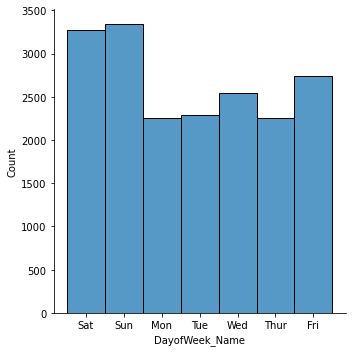

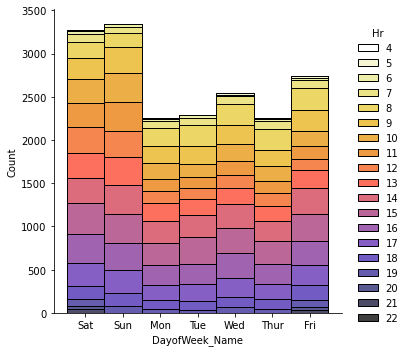

In [12]:
sns.displot(data = orders, x="DayofWeek_Name", palette = 'CMRmap_r', multiple="stack" )
sns.displot(data = orders, x="DayofWeek_Name", hue = 'Hr', palette = 'CMRmap_r', multiple="stack" )

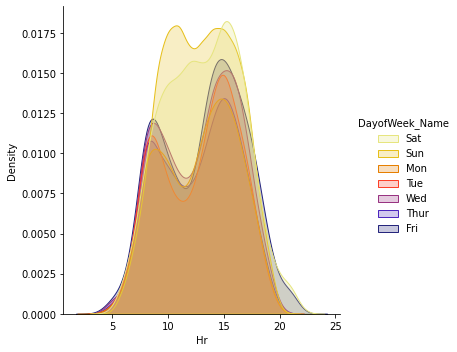

In [13]:
sns.displot(data = orders, x="Hr", hue="DayofWeek_Name", kind="kde", fill=True,palette = 'CMRmap_r')

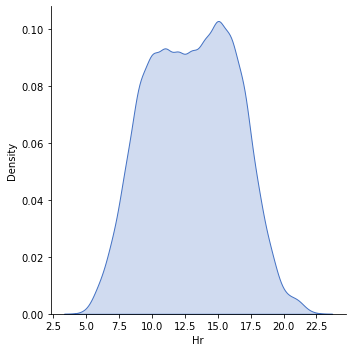

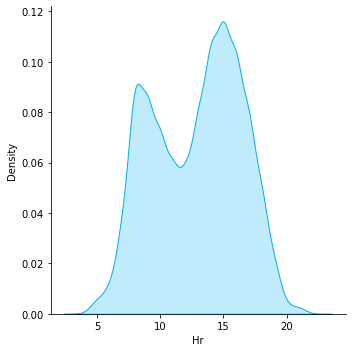

In [14]:
sns.displot(data = orders.loc[(orders['Week_Part'] == "Weekend")], x="Hr", kind="kde", fill=True, color = '#4472C4')
sns.displot(data = orders.loc[(orders['Week_Part'] == "WeekDay")], x="Hr", kind="kde", fill=True, color = '#00B0F0')

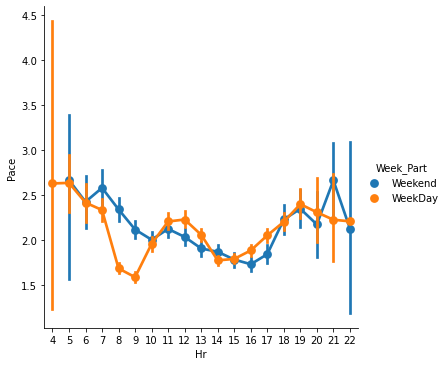

In [15]:
sns.catplot(data = orders, x="Hr", y="Pace", hue = 'Week_Part', kind="point" )

In [16]:
# Order per hour during a day
hr_metrics = orders.groupby(["Hr","Week_Part"]).size().reset_index(name='OrderCount')
avg_deliverytime_hr = orders.groupby(["Hr","Week_Part"])["ACTUAL_DELIVERY_MINUTES"].mean().reset_index()
avg_pace_hr = orders.groupby(["Hr","Week_Part"])["Pace"].mean().reset_index()
hr_metrics = pd.merge(hr_metrics, avg_deliverytime_hr ,how = 'left', on =["Hr","Week_Part"])
hr_metrics = pd.merge(hr_metrics, avg_pace_hr ,how = 'left', on =["Hr","Week_Part"])
hr_metrics = hr_metrics.rename(columns={"ACTUAL_DELIVERY_MINUTES": "Avg_DELIVERY_MINUTES","Pace":"Avg_Pace"})

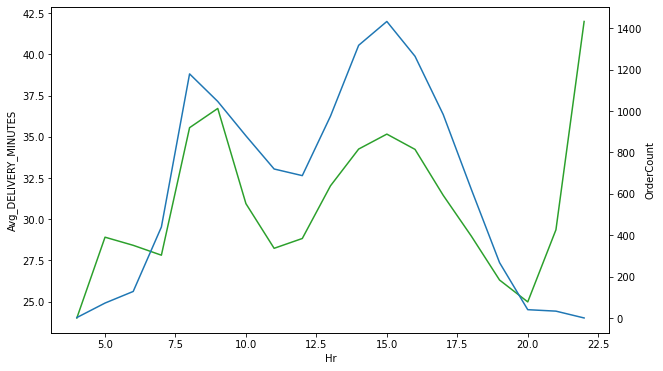

In [17]:
fig, ax1 = plt.subplots(figsize=(10,6))
ax1 = sns.lineplot(data = hr_metrics.loc[(hr_metrics['Week_Part'] == "WeekDay")], x="Hr", y="Avg_DELIVERY_MINUTES", color = 'tab:green')
ax1.tick_params(axis='y')
ax2 = ax1.twinx()
ax2 = sns.lineplot(data = hr_metrics.loc[(hr_metrics['Week_Part'] == "WeekDay")], x="Hr", y="OrderCount", markers=True, dashes=True)

### Delay Analysis:
- Rain: At an overall level, a marginal impact of 4 additional minutes can be attributed to the effects of rain. Overall taking into account rainy days does not present a big overall shift to efficiencies. During Aug and Sep 2020, only 5 % of orders occurred during heavy rain and 4% occured during light rain. 
- Distances: No clear impact is observed between delivery distance and delivery delay (estimated delivery time - actual delivery time). We observe similar volatility across distances (fig 9).  However being late on short trip vs. a long trip should be considered differently. For example, a delay of 10 minutes in a short tip vs. long trip would be interpreted differently by a consumer. There is a need to understand why there is so much volatility on short distance trips (less than 0.5 KM). Short distance trip account to 37 % of orders received in Aug and Sep 2020.
- Order Size: The overall order size (number of items in the delivery order) is not a strong indicator of potential delay (fig 10). Likely if we would expand the exercise to account for wait time at restaurant, we could observe the effect of order size driven by prep time. This would given us an indication of overall wait time for the app user.

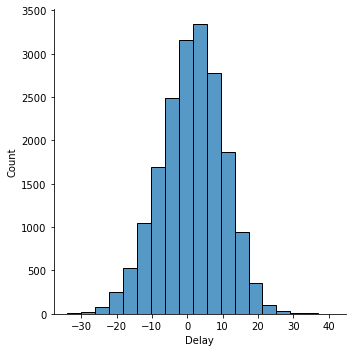

In [18]:
sns.displot(data = orders, x="Delay", bins = 19)

Rain Analysis: At an overall level, a marginal impact of 4 additional minutes can be attributed to the effects of rain. Overall taking into account rainy days does not present a big overall shift to efficiencies. During Aug and Sep 2020, only 5 % of orders occurred during heavy rain and 4% occured during light rain. The effect of rain can be observed in the heatmap comparrison across distance types. 

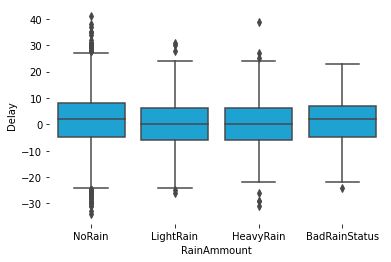

In [19]:
ax = sns.boxplot(x="RainAmmount", y="Delay", data=orders, color= "#00B0F0",
                order= ['NoRain','LightRain', 'HeavyRain', 'BadRainStatus'])
sns.despine(bottom = True, left = True)

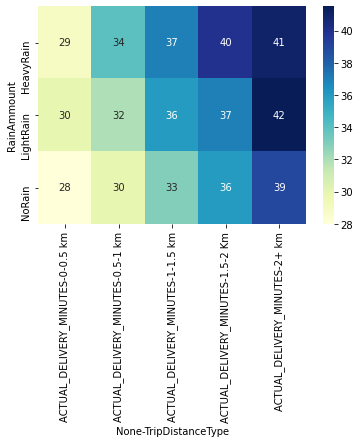

In [20]:
orders_wihtout_BadRainStatus =  orders.loc[(orders['RainAmmount'] !='BadRainStatus')]
#Creating Pivot to reflect Facts
PRECIPITATION_TripDistanceType_DeliveryRatio = pd.pivot_table(orders_wihtout_BadRainStatus,index = ['RainAmmount'],
                            columns =['TripDistanceType'],
                            values = ['ACTUAL_DELIVERY_MINUTES'],
                       aggfunc = np.median)
PRECIPITATION_TripDistanceType_DeliveryRatio
ax = sns.heatmap(PRECIPITATION_TripDistanceType_DeliveryRatio,annot=True,cmap="YlGnBu")

Distance Analysis: No clear impact is observed between delivery distance and delivery delay (estimated delivery time - actual delivery time). We observe similar volatility across distances (fig 9). However being late on short trip vs. a long trip should be considered differently. For example, a delay of 10 minutes in a short tip vs. long trip would be interpreted differently by a consumer. There is a need to understand why there is so much volatility on short distance trips (less than 0.5 KM). Short distance trip account to 37 % of orders received in Aug and Sep 2020.

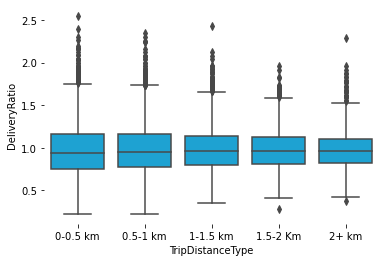

In [21]:
ax = sns.boxplot(x="TripDistanceType", y="DeliveryRatio", data=orders, color= "#00B0F0",
                order= ['0-0.5 km','0.5-1 km', '1-1.5 km', '1.5-2 Km', '2+ km'])
sns.despine(bottom = True, left = True)

Order Size Analysis: The overall order size (number of items in the delivery order) is not a strong indicator of potential delay (fig 10). Likely if we would expand the exercise to account for wait time at restaurant, we could observe the effect of order size driven by prep time. This would given us an indication of overall wait time for the app user.

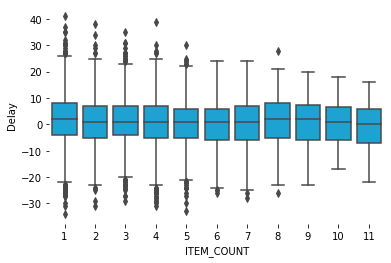

In [22]:
ax = sns.boxplot(x="ITEM_COUNT", y="Delay", data=orders, color= "#00B0F0" )
sns.despine(bottom = True, left = True)

### User Cluster Analysis:

Creating a user table to run cluster anlaysis. User table is a summary table for order counts and average delays times 

In [23]:
# Creating a user table
user_df = orders[['UserId','TimeOfDay','Week_Part', "USER_LAT","USER_LONG","Distances","Delay","ACTUAL_DELIVERY_MINUTES"]]
order_per_user = user_df.groupby(['UserId','TimeOfDay','Week_Part']).size().reset_index(name='OrderCount')
user_avg_metrics =  user_df.groupby(['UserId','TimeOfDay','Week_Part'])["USER_LAT","USER_LONG","Distances","Delay","ACTUAL_DELIVERY_MINUTES"].mean().reset_index()
user_df = pd.merge(order_per_user, user_avg_metrics ,how = 'left', on =['UserId','TimeOfDay','Week_Part'])

<ipython-input-23-0469387f37c2>:4: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  user_avg_metrics =  user_df.groupby(['UserId','TimeOfDay','Week_Part'])["USER_LAT","USER_LONG","Distances","Delay","ACTUAL_DELIVERY_MINUTES"].mean().reset_index()


Cleaning up variables to run cluster anlaysis. Performing onehot for categorical variables and and scaling for continuous

In [24]:
#Onehot for categorical feautures
orders_ML_onehot = user_df['TimeOfDay']
orders_ML_onehot = pd.get_dummies(orders_ML_onehot, columns=["TimeOfDay"] )

In [25]:
#Scaling for ordinary feautures
Scale = user_df [['OrderCount','Distances', 'Delay', 'ACTUAL_DELIVERY_MINUTES']].values[:,:]
Scale = StandardScaler().fit_transform(Scale)
Scale_df = pd.DataFrame(Scale, columns = ['OrderCount','Distances', 'Delay', 'ACTUAL_DELIVERY_MINUTES'])

In [158]:
# generate binary values using get_dummies
CleanFeautres = pd.concat([Scale_df, orders_ML_onehot], axis=1)
#CleanFeautres = orders_ML_onehot

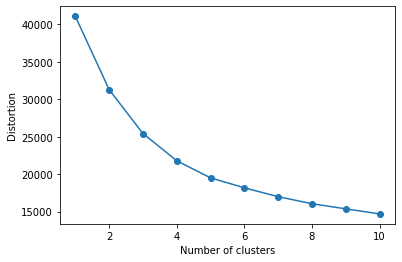

In [27]:
# Determine best number of clusters K. Calculate distortion for a range of number of cluster
distortions = []
for i in range(1, 11):
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(CleanFeautres)
    distortions.append(km.inertia_)

plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

Running Cluster Model. As we can observe Cluster 3 has the lowest delay time. 

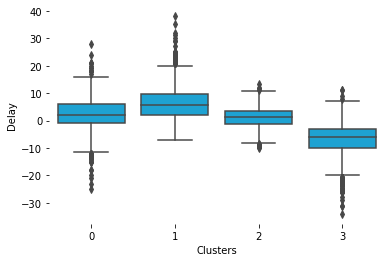

In [28]:
# Running Cluster Analysis with ideal number of clusters
k_clusters = 4
# run k-means clustering
km = KMeans(n_clusters = k_clusters, random_state=0).fit(CleanFeautres)
#Adding lables to dfs 
labels = list(km.labels_)
user_df ['Clusters'] = labels

ax = sns.boxplot(x="Clusters", y="Delay", data=user_df, color= "#00B0F0" )
sns.despine(bottom = True, left = True)

Looking at cluster 1 to determine if there is any variable that  stands out. We don't see any particular variable be a key driver for cluster 1 to have high delay.

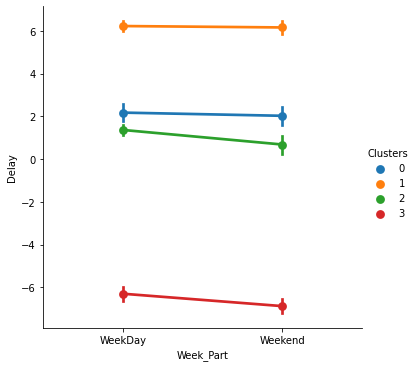

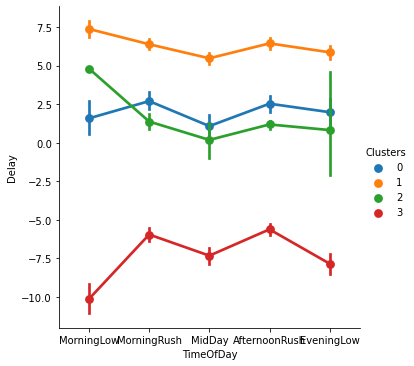

In [29]:
sns.catplot(data = user_df, x="Week_Part", y="Delay", hue = 'Clusters', kind="point" )
sns.catplot(data = user_df, x="TimeOfDay", y="Delay", hue = 'Clusters', kind="point",
            order= ['MorningLow','MorningRush', 'MidDay', 'AfternoonRush', 'EveningLow'])

Mapping cluster 1 (highest delay) to  cluster 3 (lowest delay) in the map. This map below shows that there is no area that is dominant of cluster with high delay. Delay is not geo location dependent.   

In [53]:
data_map = user_df.loc[(user_df['Clusters'] == 1) | (user_df['Clusters'] == 3)]

# set color scheme for the clusters
x = np.arange(k_clusters)
ys = [i + x + (i*x)**2 for i in range(k_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# create map of Tornto using latitude and longitude values
map_helsinki2 = folium.Map(location=[60.158, 24.946], zoom_start=15)

# set color scheme for the clusters
x = np.arange(k_clusters)
ys = [i + x + (i*x)**2 for i in range(k_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, cluster, delay in zip(data_map ['USER_LAT'], data_map ['USER_LONG'], data_map ['Clusters'], data_map ['Delay']):
    label = folium.Popup(str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=2,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_helsinki2)
    
map_helsinki2

### Venue Clusters Analysis

In [146]:
# Creating a venue table
venue_df = orders[['VenueId','VENUE_LAT','VENUE_LONG']]
order_per_venue = venue_df.groupby(['VenueId']).size().reset_index(name='OrderCount')
venue_locations = venue_df.groupby("VenueId")["VENUE_LAT","VENUE_LONG"].mean().reset_index()
venue_df = pd.merge(order_per_venue, venue_locations ,how = 'left', on =['VenueId'])
venue_df_cluster = venue_df[['OrderCount']]

<ipython-input-146-27ed95039c2d>:4: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  venue_locations = venue_df.groupby("VenueId")["VENUE_LAT","VENUE_LONG"].mean().reset_index()


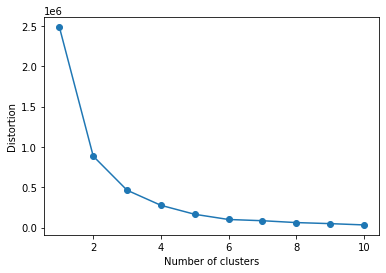

In [116]:
# Determine best number of clusters K. Calculate distortion for a range of number of cluster
distortions = []
for i in range(1, 11):
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(venue_df_cluster)
    distortions.append(km.inertia_)

plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

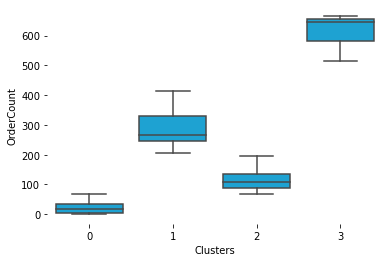

In [147]:
# Running Cluster Analysis with ideal number of clusters
k_clusters = 4
# run k-means clustering
km = KMeans(n_clusters = k_clusters, random_state=0).fit(venue_df_cluster)
#Adding lables to dfs 
labels = list(km.labels_)
venue_df ['Clusters'] = labels

ax = sns.boxplot(x="Clusters", y="OrderCount", data = venue_df, color= "#00B0F0" )
sns.despine(bottom = True, left = True)

We can observe from the map that cluster 3 (highest orders) consists of 3 main geo locations in the city. These are significant centriods of distribution. Cluster 0 (low orders) tends to be spread out  through the city. 

In [52]:
# set color scheme for the clusters
x = np.arange(k_clusters)
ys = [i + x + (i*x)**2 for i in range(k_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# create map of Tornto using latitude and longitude values
map_helsinki_venue = folium.Map(location=[60.158, 24.946], zoom_start=15)

# set color scheme for the clusters
x = np.arange(k_clusters)
ys = [i + x + (i*x)**2 for i in range(k_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, cluster, OrderCount in zip(venue_df ['VENUE_LAT'], venue_df ['VENUE_LONG'], venue_df ['Clusters'], venue_df ['OrderCount']):
    label = folium.Popup(str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=OrderCount/20,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_helsinki_venue)
    
map_helsinki_venue

Api Call to Foursquare to get Venues Types

In [58]:
# setting up credentials
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

# setting limits for query
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 250 # define radius

#Creating empty df to pass through loop
Columns = ['venue.name', 'venue.categories', 'venue.location.lat','venue.location.lng', 'venue.type', 'venue.id']
nearby_venues_summary = pd.DataFrame(columns = Columns)

#Loop Start #
for index, row in venue_df.iterrows():
    
    starting_latitude = str (venue_df ['VENUE_LAT'] [index])
    starting_longitude = str (venue_df ['VENUE_LONG'] [index])
    
    
    # create URL for API Call
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        starting_latitude, 
        starting_longitude, 
        radius, 
        LIMIT)

    # calling API
    results = requests.get(url).json()
    #number of results in API call
    totalResults = results['response']['totalResults'] 
    print ("Extracted "+  str(totalResults) +  " records during API Call") 

    if totalResults == 0: 
        continue  #pass to next if no records are returned from API call  
    
    # extracting main columns from json
    venues = results['response']['groups'][0]['items']
    # flatten json
    nearby_venues = pd.json_normalize(venues) 
    # creating df with relevant columns
    nearby_venues = nearby_venues [['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']]

    
    # getting venue types and ids from categories, and appending to nearby_venues df
    N = len(nearby_venues ['venue.categories'])
    venue_type_ls = []
    ids_ls = []

    for i in range(N):
        venue_type = nearby_venues ['venue.categories'] [i][0]['name']
        venue_type_ls.append(venue_type)
        ids = nearby_venues ['venue.categories'] [i][0]['id']
        ids_ls.append(ids)
    
    #Fomratting df#
    ############################################################################################
    # adding venue and id to nearby_venues df
    nearby_venues['venue.type'] = venue_type_ls
    nearby_venues['venue.id'] = ids_ls
    
    # adding starting point of postal code to nearby_venues df
    starting_PostalCode = str (venue_df ['VenueId'] [index])
    nearby_venues['starting_PostalCode'] = starting_PostalCode
    
    # creating summary df that containts results of each loop 
    nearby_venues_summary = pd.concat([nearby_venues_summary,nearby_venues])     
    ############################################################################################

#Loop End#        
print ("Compiling Complete")
nearby_venues_summary.head(2)

Extracted 4 records during API Call
Extracted 6 records during API Call
Extracted 7 records during API Call
Extracted 2 records during API Call
Extracted 3 records during API Call
Extracted 9 records during API Call
Extracted 13 records during API Call
Extracted 14 records during API Call
Extracted 6 records during API Call
Extracted 6 records during API Call
Extracted 11 records during API Call
Extracted 5 records during API Call
Extracted 20 records during API Call
Extracted 18 records during API Call
Extracted 4 records during API Call
Extracted 3 records during API Call
Extracted 7 records during API Call
Extracted 5 records during API Call
Extracted 7 records during API Call
Extracted 8 records during API Call
Extracted 27 records during API Call
Extracted 22 records during API Call
Extracted 6 records during API Call
Extracted 15 records during API Call
Extracted 19 records during API Call
Extracted 24 records during API Call
Extracted 23 records during API Call
Extracted 25 reco

Extracted 21 records during API Call
Extracted 17 records during API Call
Extracted 23 records during API Call
Extracted 7 records during API Call
Extracted 24 records during API Call
Extracted 22 records during API Call
Extracted 16 records during API Call
Extracted 30 records during API Call
Extracted 29 records during API Call
Extracted 6 records during API Call
Extracted 24 records during API Call
Extracted 17 records during API Call
Extracted 18 records during API Call
Extracted 17 records during API Call
Extracted 41 records during API Call
Extracted 36 records during API Call
Extracted 5 records during API Call
Extracted 13 records during API Call
Extracted 20 records during API Call
Extracted 26 records during API Call
Extracted 31 records during API Call
Extracted 28 records during API Call
Extracted 26 records during API Call
Extracted 29 records during API Call
Extracted 17 records during API Call
Extracted 17 records during API Call
Extracted 17 records during API Call
Extr

,venue.name,venue.categories,venue.location.lat,venue.location.lng,venue.type,venue.id,starting_PostalCode
0,Levant,"[{'id': '4bf58dd8d48988d115941735', 'name': 'M...",60.150,24.888,Middle Eastern Restaurant,4bf58dd8d48988d115941735,60.149-24.887
1,Trattoria Limone,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",60.151,24.885,Italian Restaurant,4bf58dd8d48988d110941735,60.149-24.887


In [148]:
Restuarants = pd.read_csv('C:/Users/jcvil/Desktop/Git-Hub-Projects/Coursera_Capstone/'+'FinlandVenueSegments.csv')

In [149]:
nearby_venues_summary_analysis = nearby_venues_summary[['starting_PostalCode','venue.type']]
nearby_venues_summary_analysis = nearby_venues_summary_analysis.rename(columns={"venue.type": "venue_type",'starting_PostalCode': "VenueId"})
nearby_venues_summary_analysis =  pd.merge(nearby_venues_summary_analysis, Restuarants ,how = 'right', on =["venue_type"])
nearby_venues_summary_analysis = pd.merge(venue_df,nearby_venues_summary_analysis ,how = 'left', on =["VenueId"])

In [153]:
venuetype_clusters =  pd.merge(venue_df, nearby_venues_summary_analysis [['VenueId','venue_type']] ,how = 'left', on =["VenueId"])
venuetype_clusters  = venuetype_clusters[['Clusters','venue_type']]
venuetype_clusters = venuetype_cluster.groupby(["Clusters","venue_type"]).size().reset_index(name='Count')
venuetype_cluster_0 = venuetype_cluster.loc[(venuetype_cluster['Clusters'] == 0)] 
venuetype_cluster_3 = venuetype_cluster.loc[(venuetype_cluster['Clusters'] == 3)]

Looking at cluster 0 and cluster 3 compositions, please only look at ranking not Count. Both clusters have Coffee Shops or Cafes at the top. What is interesting is that Scandinavian Restaurant is ranked high in Cluster 0 which is the cluster that is spread out. For cluster 3 which is more in the central area part of town, we start to see Middle Eastern type food higher than Scandinavian. To a certain extent, this shows the urbanity influences food options. 

In [159]:
venuetype_cluster_0.sort_values(by='Count', ascending=False).head(5)

,Clusters,venue_type,Count
13,0,Café,260
59,0,Scandinavian Restaurant,210
17,0,Coffee Shop,188
51,0,Pizza Place,162
65,0,Sushi Restaurant,144


In [160]:
venuetype_cluster_3.sort_values(by='Count', ascending=False).head(5)

,Clusters,venue_type,Count
192,3,Coffee Shop,6
190,3,Café,5
193,3,Falafel Restaurant,4
201,3,Middle Eastern Restaurant,3
206,3,Scandinavian Restaurant,3


### Conlusions:

Through the report, we gathered initial insights and identified the following opportunities to drive efficiencies: 

- Weekday Peak Hours (8:00-9:00 AM): This time-slot is crucial both from an order volume and slowdown on delivery speed. We can't solve for traffic rush hour, however we can focus on optimizing routes by developing models/simulations to optimize the restaurant's list presented to consumers. Another aspect to explore is how mode of transportation plays an effect (bikes, scooters, or walking).  Neighborhood clustering would also present an interesting view to the problem, is the downtown area an issue, etc. 

- Leveraging Non-Peak Hours (10:00 AM-13:00 PM): This time-slot presents a sizeable opportunity to diversify. During the time-slot, the volume order decreases while Wolt delivery associates are already up and running. Could an alternative option be presented to consumers with groceries? To a certain extent, groceries would not be on lunch or breakfast dependent. Imagine creating "A Wolt Grocery Happy Hour" driven by  discounts.  

- The Volatility of Shop Trips: Short distance trips account to 37 % of orders. A notable point to uncover is the high fluctuation in short trips. Getting further and more detailed information can help uncover the fluctuation drivers. Few metrics to consider (attempts delivery associate called user, wait time at the restaurant, # floors of the building, etc). 

- User Clustering: We have mapped cluster 1 (highest delay) to  cluster 3 (lowest delay) in the map. The map  shows that there is no area that is dominant of cluster with high delay or low delay. This can help us conclude that delay is not geo location dependent.   

- Venue Custering: We can observe from the map that cluster 3 (highest orders) consists of 3 main geo locations in the city. These are significant centriods of distribution. Cluster 0 (low orders) tends to be spread out  through the city. Looking at cluster 0 and cluster 3 compositions. Both clusters have Coffee Shops or Cafes at the top. What is interesting is that Scandinavian Restaurant is ranked high in Cluster 0 which is the cluster that is spread out. For cluster 3 which is more in the central area part of town, we start to see Middle Eastern type food higher than Scandinavian. To a certain extent, this shows the urbanity influences food options.
